In [1]:
# Домашка. Коваленко Лиана stepik id 265683406

# Для выполнения домашнего задания я выбрала архитектуру NST.
# Задачей будет изменение фотографии с изображением зимнего леса с помощью двух стилей.
# Первый стиль - живопись маслом.
# Второй стиль - витражи\мозайка.

In [2]:
# Первая опция.
# Разделю картинку на две части и переносу на них разные стили. Разделять буду горизонтально.

In [3]:
# Импортирую библиотеки

%matplotlib inline
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torchvision.models as models
import copy
from google.colab import drive

In [4]:
# Посмотрю файлы в папке images

drive.mount('/content/gdrive/')
!ls gdrive/MyDrive/images

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
afanasovo.jpg  dancing.jpg   liana.JPG	 muha2.JPG    snow.JPG
ballerina.jpg  greencar.jpg  lisa.jpg	 muha.JPG
block.jpg      kiss.JPG      mosaic.jpg  picasso.jpg


In [5]:
# Буду работать на GPU для ускорения процесса обучения

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [6]:
# Загружу изображения
# Нам понадобятся картинки стиля и контента, так что загрузим их.
# Чтобы упростить реализацию, начнем с контента и стиля одного размера.
# Затем мы масштабируем их до требуемых размеров выходного изображения.

imsize = 1024 #128
loader = transforms.Compose([
    transforms.Resize(imsize),     # изменяет размер входного изображения до заданного размера
    transforms.CenterCrop(imsize), # обрезает данное изображение по центру.
    transforms.ToTensor()])        # обычные преобразования изображений. Их можно объединить в цепочку с помощью Compose

unloader = transforms.ToPILImage() # тензор в кратинку  

# функця для загрузки изображений
def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

# функця отрисовки изображений
def imshow(tensor, title=None):
    image = tensor.cpu().clone()   
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [7]:
# Загружаю фотографии стилей и фотграфию леса(контент)

style1_img = image_loader("gdrive/MyDrive/images/snow.JPG")
style2_img = image_loader("gdrive/MyDrive/images/mosaic.jpg")
content_img = image_loader("gdrive/MyDrive/images/afanasovo.jpg")

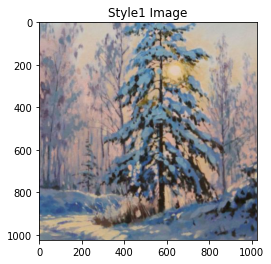

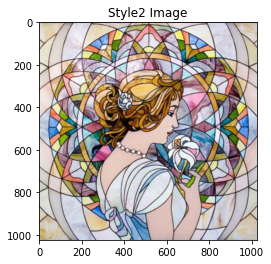

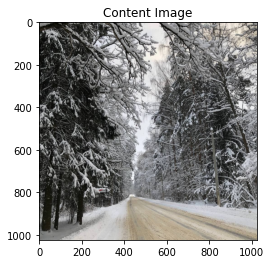

In [8]:
# Отрисовываю фотографии стилей и контента

plt.figure()
imshow(style1_img, title='Style1 Image')

plt.figure()
imshow(style2_img, title='Style2 Image')

plt.figure()
imshow(content_img, title='Content Image')

In [9]:
# Теперь нужно создать функции, которые будут вычислять расстояния (  DC  и  DS ).
# Они будут выполенены в виде слоев, чтобы брать по ним автоградиент.
# DS  - средняя квадратичная ощибка input'а и target'а

class ContentLoss(nn.Module):

        def __init__(self, target,):
            super(ContentLoss, self).__init__()
            # we 'detach' the target content from the tree used
            # to dynamically compute the gradient: this is a stated value,
            # not a variable. Otherwise the forward method of the criterion
            # will throw an error.
            self.target = target.detach() #это константа. Убираем ее из дерева вычеслений
            self.loss = F.mse_loss(self.target, self.target ) #to initialize with something

        def forward(self, input):
            self.loss = F.mse_loss(input, self.target)
            return input

# Матрица грама позволяет учесть не только сами значения feature map'а, но и кореляцию фич друг с другом.
# Это нужно для того, чтобы сделать акцент на встречаемость фич с друг другом, а не на их геометрическом положении.
# Сначала задаем спрособ подсчета матрицы грама: Это просто тензорное  
# произведение вектора выхода уровня самого на себя.
# Однако наш выход - не вектор. В этом случае операция тоже возможна,
# но мы получим тензор третьего ранга. Поэтому перед перемножением выход нужно привести к форме вектора.

# функция получения матрицы грамма
def gram_matrix(input_image):
        batch_size, f_map_num, h, w  = input_image.size()  # batch size(=1)
        features = input_image.view(batch_size * f_map_num, h * w) 
        G = torch.mm(features, features.t())  # compute the gram product
        # we 'normalize' the values of the gram matrix
        # by dividing by the number of element in each feature maps.
        return G.div(batch_size * f_map_num * h * w)

In [10]:
# Реализация MSE

# в класса StyleLoss сделаю дополнительную функцию описывающаю различные варианты применения стилей (mode)
# horizontal - горизонтальное разделение и применение стилей к каждой из половинок
# both - оба стиля применяются к изображению

class StyleLoss(nn.Module):
    
    def __init__(self, target_feature, style, mode="horizontal"):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
        self.loss = F.mse_loss(self.target, self.target)
        self.mode = mode
        self.style = style

    def forward(self, input_image):
        mask_image = StyleLoss.split_dict[self.mode](self, input_image)
        G = gram_matrix(mask_image)
        self.loss = F.mse_loss(G, self.target)
        return input_image
    
    def horizontal_split(self, input_image):
        mask = torch.zeros_like(input_image)
        _, _, h, _ = mask.size()
        if self.style == "style1":
            mask[:, :, :h//2, :] +=1
    
        if self.style == "style2":
            mask[:, :, h//2:, :] +=1
        
        return input_image * mask
    
    def both_split(self, input_image):
        return torch.clone(input_image)

    split_dict = {
        "horizontal": horizontal_split,  
        "both" : both_split
    }

In [11]:
# При тренировке VGG каждое изображение на котором она обучалась было нормировано по всем каналам (RGB).
# Если мы хотим изпользовать ее для нашей модели, то мы должны реализовать нормировку 
# и для наших изображений тоже.

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
        def __init__(self, mean, std):
            super(Normalization, self).__init__()
            # .view the mean and std to make them [C x 1 x 1] so that they can
            # directly work with image Tensor of shape [B x C x H x W].
            # B is batch size. C is number of channels. H is height and W is width.
            self.mean = torch.tensor(mean).view(-1, 1, 1)
            self.std = torch.tensor(std).view(-1, 1, 1)

        def forward(self, img):
            # normalize img
            return (img - self.mean) / self.std

In [12]:
# Определим после каких уровней мы будем счиатать ошибки стиля, 
# а после каких ошибки контента.

# слой для вывода content_loss
content_layers_default = ['conv_4']
# слои для вывода соответствующего style_loss
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

In [13]:
# Определим предобученную модель

cnn = models.vgg19(pretrained=True).features.to(device).eval()

In [14]:
# 2 слоя StyleLoss для каждого из стилей будет в модели
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                                   style1_img, style2_img, content_img, mode="horizontal",
                                   content_layers=content_layers_default,
                                   style_layers=style_layers_default):
        cnn = copy.deepcopy(cnn)

        # normalization module
        normalization = Normalization(normalization_mean, normalization_std).to(device)

        # just in order to have an iterable access to or list of content/syle
        # losses
        content_losses = []
        style1_losses = []
        style2_losses = []

        # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
        # to put in modules that are supposed to be activated sequentially
        model = nn.Sequential(normalization) 
        
        i = 0  # increment every time we see a conv
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                # The in-place version doesn't play very nicely with the ContentLoss
                # and StyleLoss we insert below. So we replace with out-of-place
                # ones here.
                #Переопределим relu уровень
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

            model.add_module(name, layer)

            if name in content_layers:
                # add content loss:
                target = model(content_img).detach()
                content_loss = ContentLoss(target)
                model.add_module("content_loss_{}".format(i), content_loss)
                content_losses.append(content_loss)

            if name in style_layers:
                # add style1 loss
                target1_feature = model(style1_img).detach()
                style1_loss = StyleLoss(target1_feature, "style1", mode)
                model.add_module("style1_loss_{}".format(i), style1_loss)
                style1_losses.append(style1_loss)
                
                # add style2 loss
                target2_feature = model(style2_img).detach()
                style2_loss = StyleLoss(target2_feature, "style2", mode)
                model.add_module("style2_loss_{}".format(i), style2_loss)
                style2_losses.append(style2_loss)

        # now we trim off the layers after the last content and style losses
        #выбрасываем все уровни после последенего style loss или content loss
        for i in range(len(model) - 1, -1, -1):
            if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
                break

        model = model[:(i + 1)]

        return model, style1_losses, style2_losses, content_losses

In [15]:
def get_input_optimizer(input_img):
        # this line to show that input is a parameter that requires a gradient
        #добоваляет содержимое тензора катринки в список изменяемых оптимизатором параметров
        optimizer = optim.LBFGS([input_img.requires_grad_()]) 
        return optimizer

In [16]:
# Дальше стандартный цикл обучения
# closure - функция, которая вызывается во время каждого прохода, чтобы пересчитать loss. 
# Без нее ничего не получется, так как у нас своя функция ошибки

def run_style_transfer(cnn, normalization_mean, normalization_std,
                        input_img, style1_img, style2_img, content_img, mode="horizontal",
                        num_steps=550,
                        style1_weight=1e8, style2_weight=1e6, content_weight=1):
        """Run the style transfer."""
        
        print('Building the style transfer model..')
        model, style1_losses, style2_losses, content_losses = get_style_model_and_losses(cnn,
            normalization_mean, normalization_std, style1_img, style2_img, content_img, mode)
        optimizer = get_input_optimizer(input_img)

        print('Optimizing..')
        run = [0]
        while run[0] <= num_steps:

            def closure():
                # correct the values 
                # это для того, чтобы значения тензора картинки не выходили за пределы [0;1]
                input_img.data.clamp_(0, 1)

                optimizer.zero_grad()

                model(input_img)

                style1_score = 0
                style2_score = 0
                content_score = 0

                for sl in style1_losses:
                    style1_score += sl.loss    
                for sl in style2_losses:
                    style2_score += sl.loss    
                for cl in content_losses:
                    content_score += cl.loss
                
                #взвешивание ощибки
                style1_score *= style1_weight
                style2_score *= style2_weight
                content_score *= content_weight

                loss = style1_score + style2_score + content_score
                loss.backward()

                run[0] += 1
                if run[0] % 100 == 0:
                    string_to_print = "run {} steps \n".format(run[0])
                    string_to_print += 'Style1 Loss: {:4f}  Style2 Loss: {:4f}  Content Loss: {:4f}'.format(
                        style1_score.item(), style2_score.item(), content_score.item())
                    plt.figure(figsize=(10, 10))
                    imshow(input_img, title=string_to_print)

                return loss

            optimizer.step(closure)

        # a last correction...
        input_img.data.clamp_(0, 1)

        return input_img

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


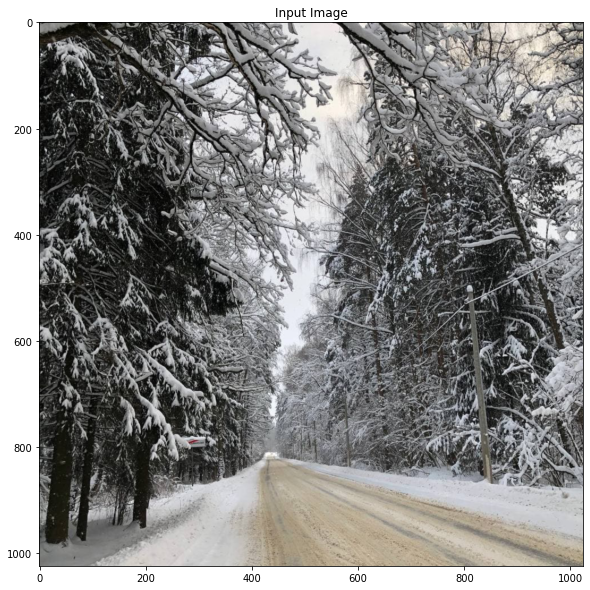

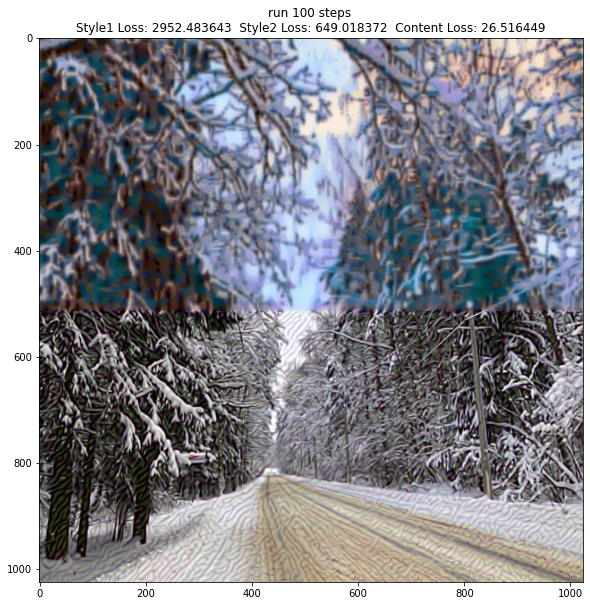

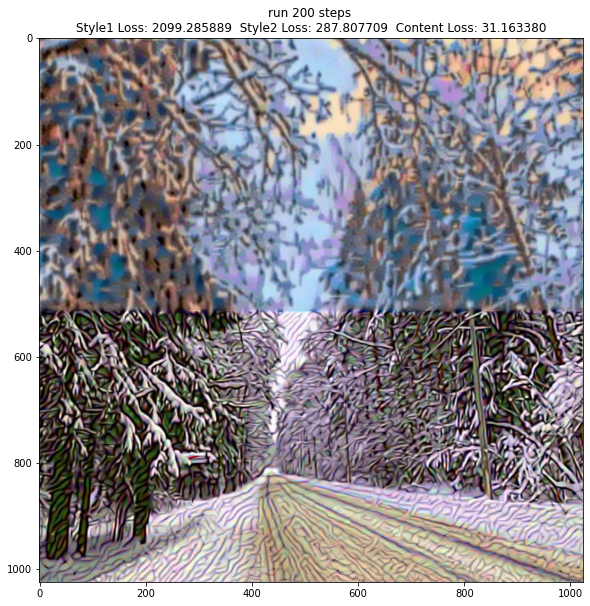

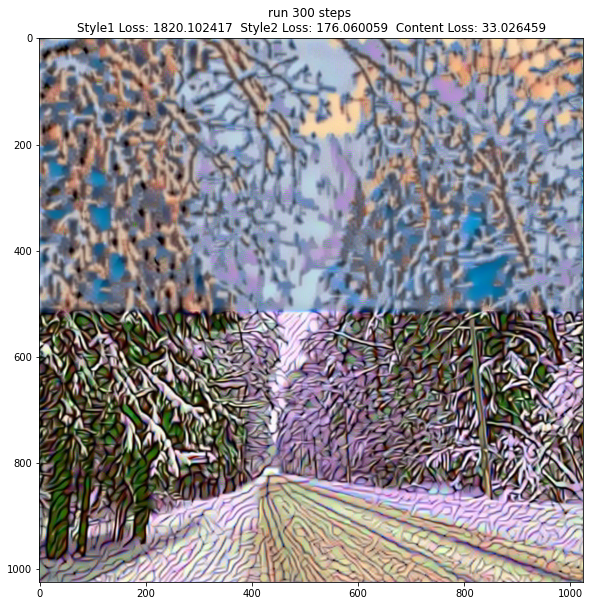

In [17]:
# Применим два стиля, разделяя границу горизонтально 

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure(figsize=(10, 10))
imshow(input_img, title='Input Image')
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            input_img, style1_img, style2_img, content_img, mode="horizontal", num_steps=300)

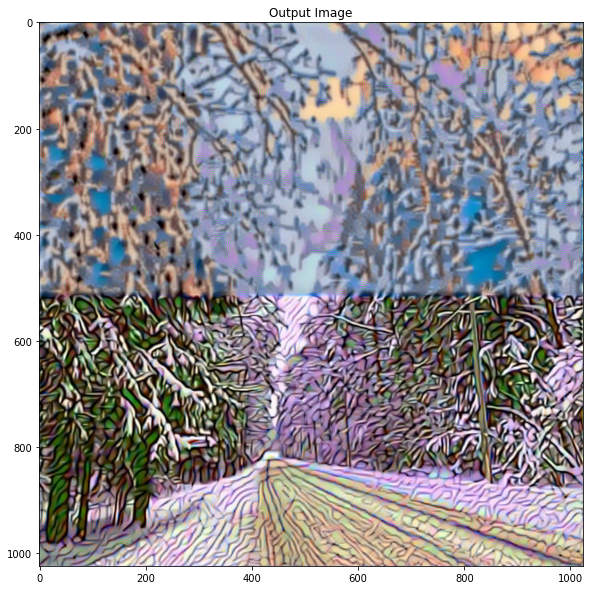

In [18]:
# Результат после 550 шагов
plt.figure(figsize=(10, 10))
imshow(output, title='Output Image')

In [19]:
# Мои комментарии о подборе весов стиля:
# В начале я пославила одинаковыые веса 1е6 на оба стиля, 
# однако я после обучения стиль с витражами\мозайкой проявился сильнее,
# и сильно искажал изначальное изображение. 
# Тогда я поменяла веса у мозаичного стиля 1e8.

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


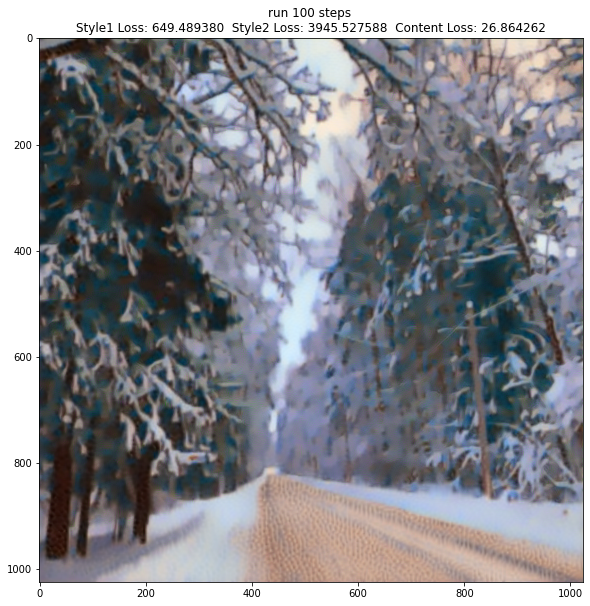

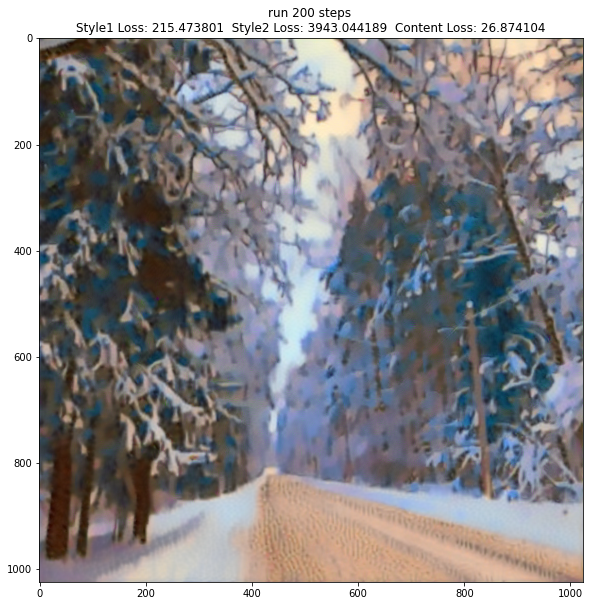

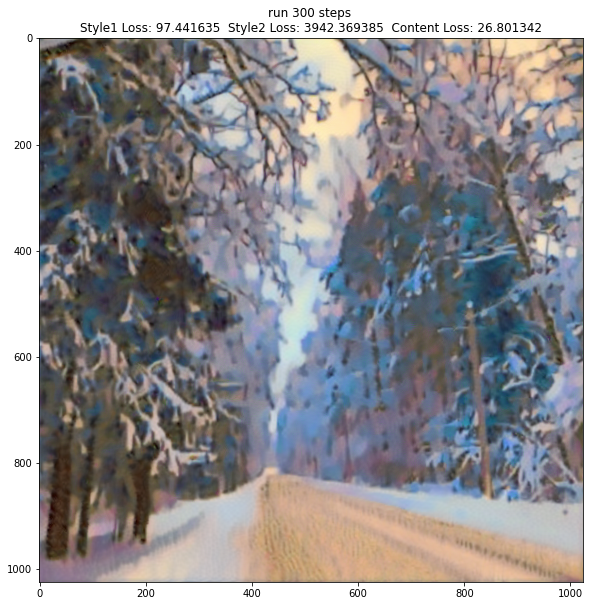

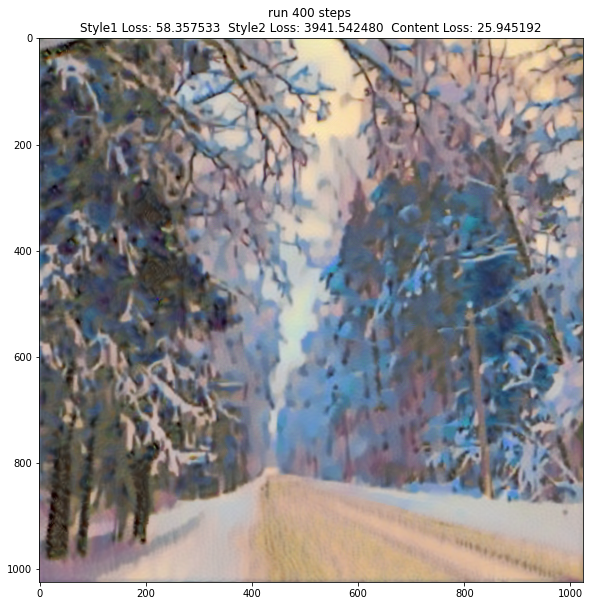

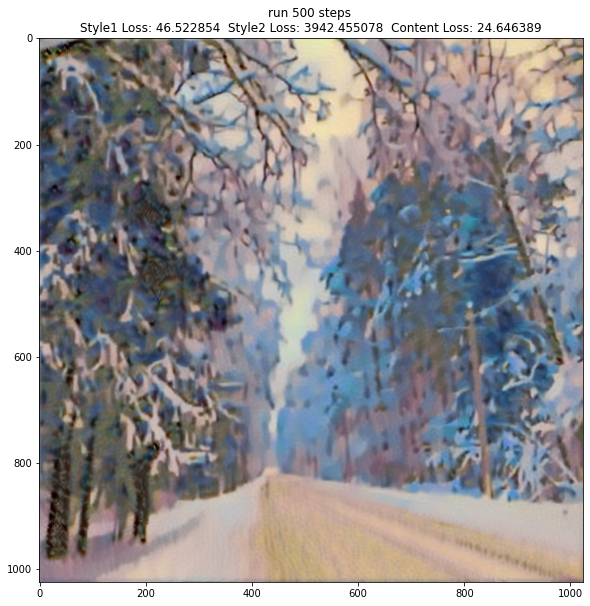

In [21]:
# Выполню вторую часть задания и променю оба стиля к изображению единовременно.

input_img_2 = content_img.clone()
output_2 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            input_img_2.clone(), style1_img, style2_img,
                             content_img, mode="both", num_steps=550)

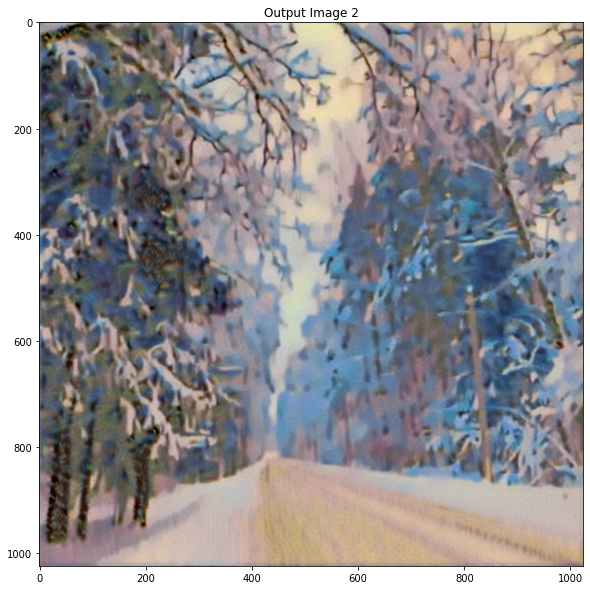

In [26]:
# Результат 
plt.figure(figsize=(10, 10))
imshow(output_2, title='Output Image 2')

In [22]:
# попробую поменять веса и количество шагов, чтобы стиль с витражами\мозайкой был более выражен.

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


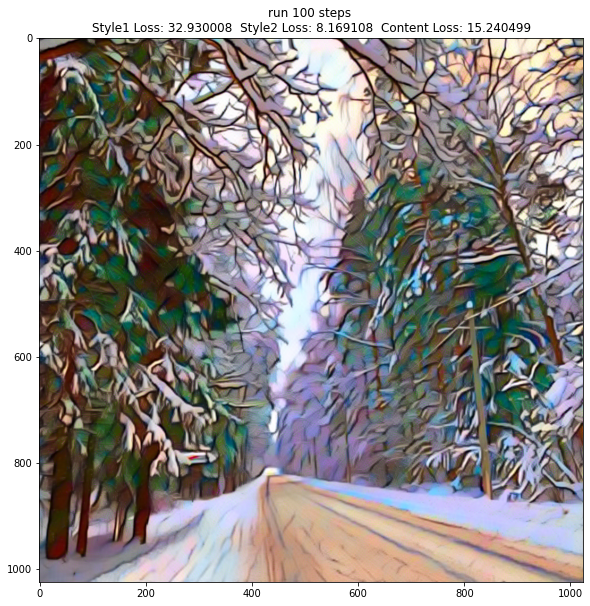

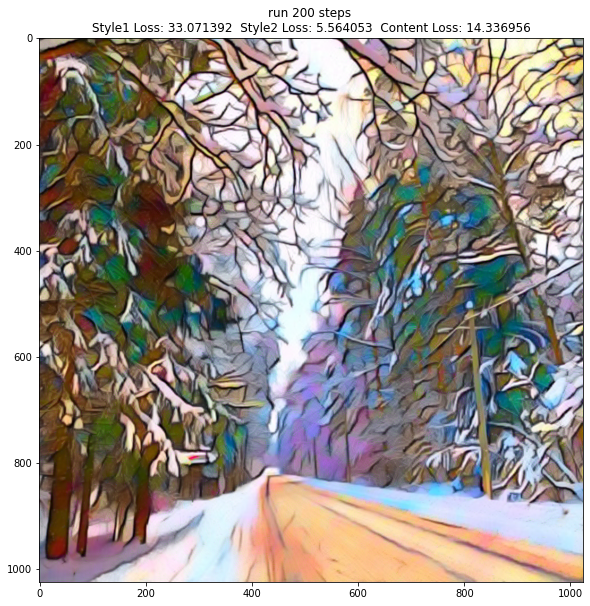

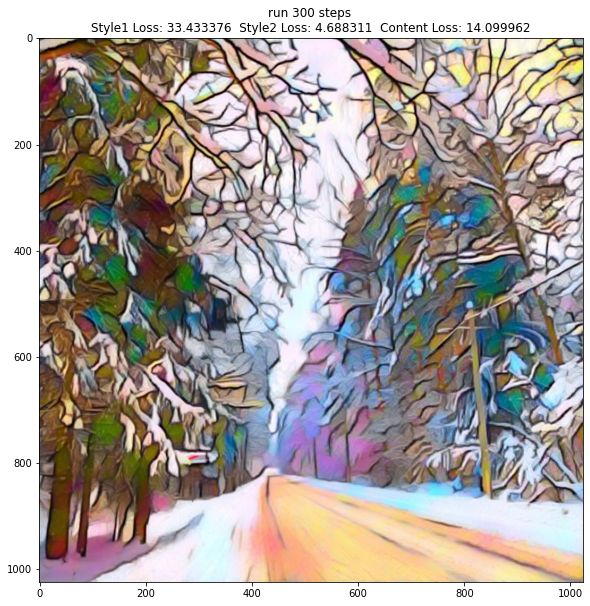

In [31]:
input_img_3 = content_img.clone()
output_3 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            input_img_2.clone(), style1_img, style2_img, content_img, 
                            mode="both", num_steps=350, style1_weight=1e4, style2_weight=1e5)

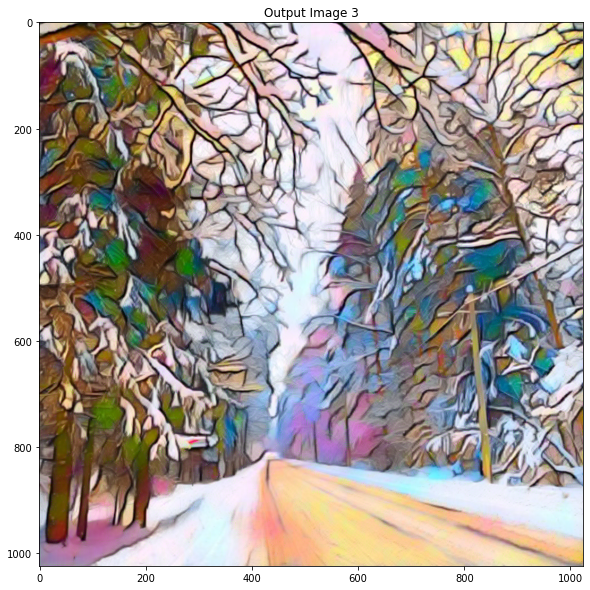

In [32]:
# Результат 
plt.figure(figsize=(10, 10))
imshow(output_3, title='Output Image 3')

In [33]:
# Выводы:
# 1)После изменения весов стиль с витрожами\мозайкой проявляется сильнее.
# 2)Более мягкий стиль проявляется на первых 100 шагах, 
# после 200 шага сильнее видны изменения в цвете, а так же сильнее искажаются детали.
# 3)В целом, изображение более приятно выглядить на первых 100 шагах.